# Buenos Aires' streets and bikelanes

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely import wkt
import matplotlib.pyplot as plt

/home/bavio/miniconda3/envs/gpd/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home/bavio/miniconda3/envs/gpd/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


## Load and tidy street data

Dataset will only contain streets and avenues (excluding pedestrian streets, highways, trails, etc.).

In [47]:
cols = ['WKT', 'nomoficial', 'tipo_c', 'long', 'sentido',
        'bicisenda', 'ciclo_obse', 'BARRIO']
calles = (pd.read_csv('../data/original/calles.csv', usecols=cols)
            .assign(geometry = lambda df: df.WKT.map(wkt.loads),
                    bicisenda = lambda df: df.bicisenda.str.upper(),
                    nomoficial = lambda df: df.nomoficial.str.upper())
            .drop(columns=['WKT'])
            .query("tipo_c in ['AVENIDA', 'CALLE'] & sentido in ['DOBLE', 'CRECIENTE', 'DECRECIENTE']")
            .rename(columns={'tipo_c': 'category', 'nomoficial': 'name', 'sentido': 'way',
                             'bicisenda': 'bikelane', 'BARRIO': 'hood', 'long': 'length'})
)

Strings columns containing street names and categorical variables are cleaned for better handling. Tildes are removes, all upercase, remove characters other than letters.

In [48]:
calles.loc[:, 'name'] = (calles.name
     .str.normalize(form='NFD')
     .str.replace('[\u0300-\u0302\u0304-\u036f]', '')
     .str.replace('(AV\.)|,|\.|-|\(.+\)|°|º', ' ')
     .str.strip()
     .str.replace('\s+', ' ')
)

In [49]:
calles.loc[:, 'bikelane'] = (calles.bikelane
.str.normalize(form='NFD')
.str.replace('[\u0300-\u036f|-]', '')
)

All bikelanes built during 2018 are removed.

In [50]:
excluded = [
    'Construcción en Agosto de 2018', 'Construcción en Octubre de 2018', 'Construcción Noviembre de 2018',
    'Comienzo de Construcción Noviembre de 2018', 'Construcción Marzo 2018', 'Construcción Mayo 2018',
    'Construcción Octubre de 2018', 'Construcción en Septiembre de 2018', 'Construcción Febrero 2018',
    'Construcción Noviembre de 2018. Calzada paralela y adyacente a la vereda noreste',
    'Construcción Noviembre de 2018. Calzada paralela y adyacente a la vereda sureste',
    'Figuraba como Ciclovía proyectada pero comunicaron que se sacara el 06/11/2018'
]

In [51]:
calles.loc[calles.ciclo_obse.isin(excluded), 'bikelane'] = ''

In [52]:
excluded = ['CICLOVIAS PROYECTADAS', 'CICLOVIAS EN OBRA', 'CARRILES PREFERENCIALES']
calles.loc[calles.bikelane.isin(excluded), 'bikelane'] = ''

In [53]:
calles.loc[:, 'bikelane'] = calles.bikelane.replace('', 'NONE')

Some entries have missing hood data, we add them by finding wich lines intersects the most with the hood shapes insite hood dataset

In [58]:
hoods = (pd.read_csv('../data/original/hoods.csv', usecols=['WKT', 'barrio'])
           .rename(columns={'WKT': 'geometry', 'barrio': 'name'})
           .assign(geometry = lambda df: df.geometry.map(wkt.loads))
)

In [78]:
def find_hood(calles, hoods):
    answer = []
    for calle in calles:
        shadow = list(map(lambda poly: calle.intersection(poly[1]).length/calle.length, hoods))
        name = max(range(len(shadow)), key=shadow.__getitem__)
        answer.append(hoods[name][0])
    return answer

In [83]:
street_shapes = calles.loc[calles.hood.isna(), 'geometry'].tolist()
hoods_nameshp = [(row['name'], row['geometry']) for i, row in hoods.iterrows()]
calles.loc[calles.hood.isna(), 'hood'] = find_hood(street_shapes, hoods_nameshp)

### Plotting a map containig all streets and bikelanes

In [86]:
geocalles = gpd.GeoDataFrame(calles)

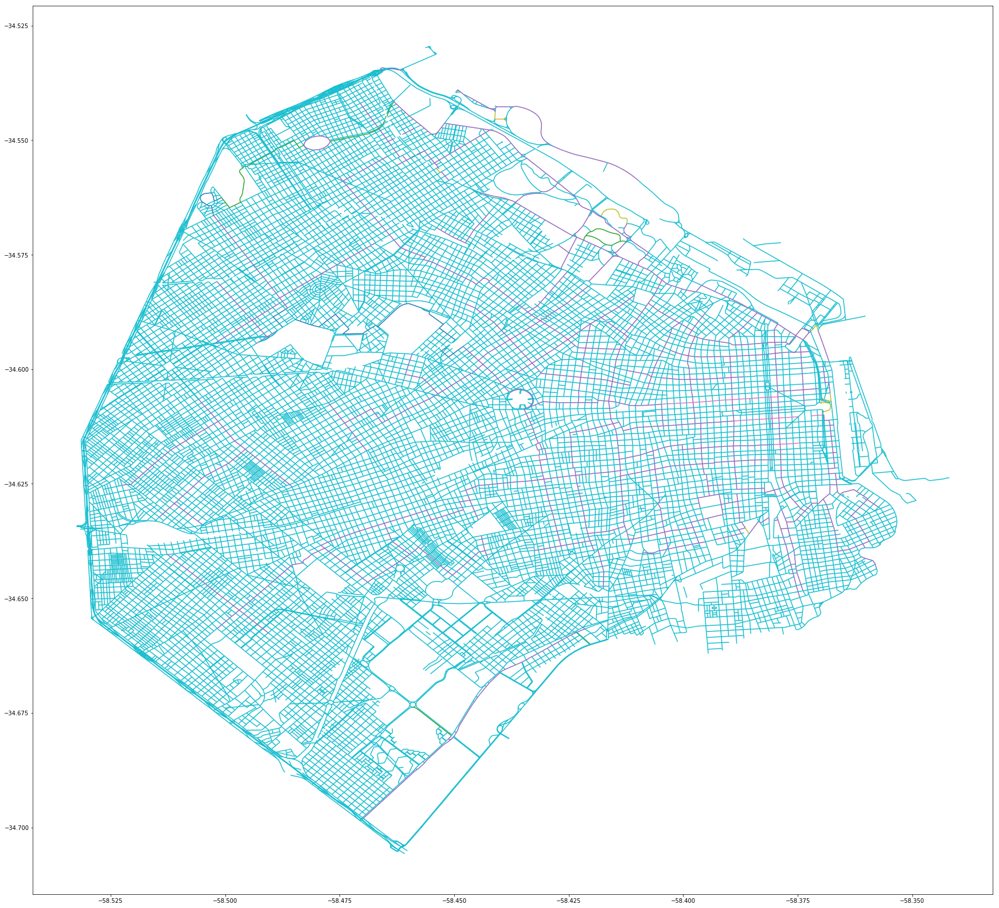

In [87]:
fig, ax = plt.subplots(1,1,figsize=(30,30))
geocalles.plot(column='bikelane', ax=ax)

## Aggregating streets by name, category, way, neighborhood and bikelane

Next we aggregate and sum all the lengths.

In [88]:
streets = calles.groupby(['name', 'category', 'way', 'bikelane', 'hood'],as_index=False).length.sum()

New datasets lacks street's geometries. For this, we aggregate them by using shapely cascaded_union function.

In [40]:
from shapely.ops import cascaded_union as union

In [41]:
def street_shape(streets, calles):
    shapes = []

    def _getShapes(data):
        search = "name==@data[0] & category==@data[1] & way==@data[2] & bikelane==@data[3] & hood==@data[4]"
        subset = calles.query(search)
        return union(subset.geometry.tolist())

    for i, row in streets.iterrows():
        data = (row['name'], row['category'], row['way'], row['bikelane'], row['hood'])
        shapes.append(_getShapes(data))
    
    return shapes

In [94]:
streets.loc[:, 'geometry'] = street_shape(streets, calles)

In [98]:
streets.to_csv('../data/streets.csv', index=False)

## Adding crash count to dataset

In [99]:
crash = (pd.read_csv('../data/crash-2017.csv')
           .assign(geometry = lambda df: df.geometry.map(wkt.loads))
)

In [100]:
streets = streets.assign(area = lambda df: df.geometry.map(lambda x: x.buffer(0.000190)))

In [123]:
def add_crashes(areas, crashes):
    counts = []
    
    def _remove_from_crashes(points):
        for target in points:
            crashes.remove(target)
        return None
    
    def _points_on_area(area):
        l, b, r, t = area.bounds
        return filter(lambda data: (r >= data['x'] >= l) & (t >= data['y'] >= b), crashes)
        
    def _iscontained(area, check):
        contained = list(filter(lambda x: area.intersects(x['shape']), check))
        _remove_from_crashes(contained)
        return contained
    
    for area in areas:
        tocheck = _points_on_area(area)
        counts.append(len(_iscontained(area, tocheck)))
    
    return counts

In [103]:
crashdata = [
    {'x':row['geometry'].coords[0][0], 'y':row['geometry'].coords[0][1], 'shape': row['geometry']}
    for i, row in crash.iterrows()
]

In [104]:
streets.loc[:, 'crash'] = add_crashes(streets.area.tolist(), crashdata)

In [111]:
streets = (streets.rename(columns={'bikelane': 'bikecat'})
                  .assign(bikelane = lambda df: df.bikecat.apply(lambda x: 0 if x=='NONE' else 1))
)

In [125]:
streets.to_csv('../data/streets.csv', index=False)

In [112]:
geocrashes = gpd.GeoDataFrame(crash)
geostreets = gpd.GeoDataFrame(streets)

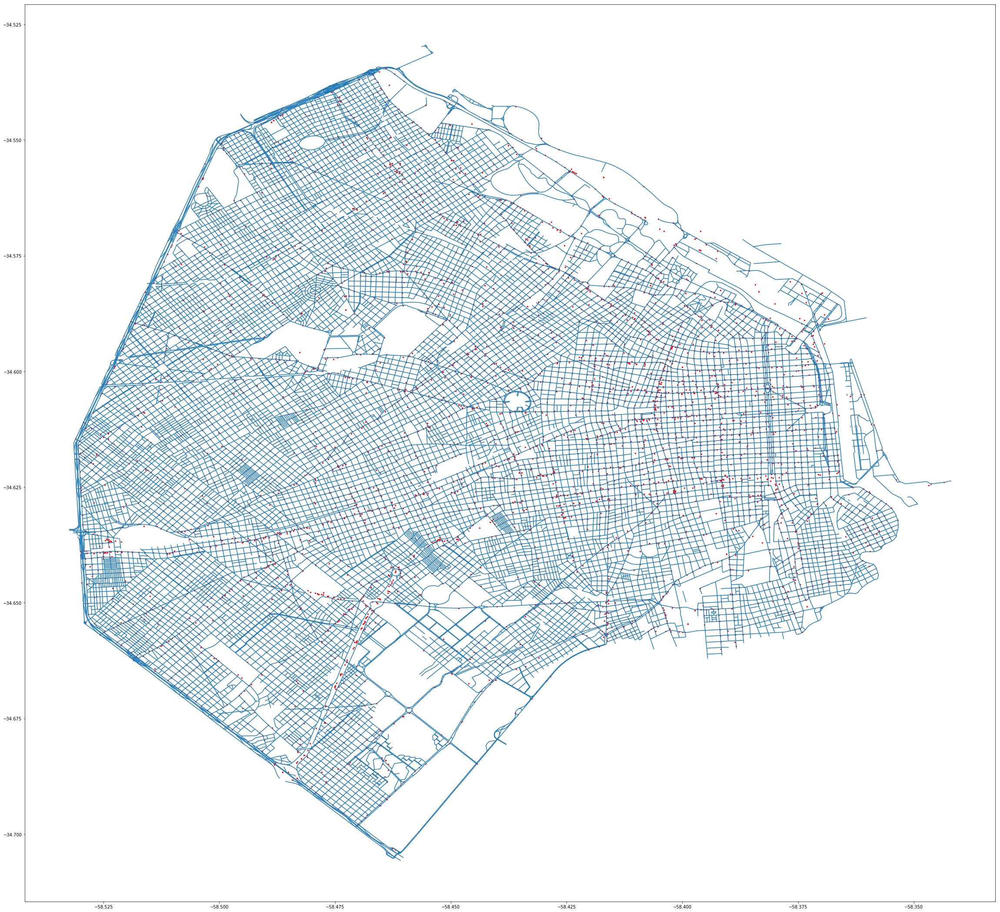

In [114]:
fig, ax = plt.subplots(1,1,figsize=(40,40))
geostreets.plot(ax=ax)
geocrashes.plot(markersize=5, color='red', ax=ax)

## Revisiting after the first model fitting

In [53]:
streets = pd.read_csv('../data/streets.csv')

In [54]:
blcat = {
    'BICISENDAS': 1,
    'BICISENDAS PREEXISTENTES': 1,
    'CICLOVIAS': 2,
    'CICLOVIAS MANO UNICA': 2,
    'INTERRUMPIDA POR OBRAS': 2,
    'NONE': 0
}

waycat = {
    'CRECIENTE': 0,
    'DECRECIENTE': 0,
    'DOBLE': 1
}

street_category = {
    'CALLE': 0,
    'AVENIDA': 1
}

In [55]:
streets = (streets
               .assign(way = streets.way.map(lambda x: waycat[x]),
                       bikecat = streets.bikecat.map(lambda x: blcat[x]),
                       category = streets.category.map(lambda x: street_category[x]),
                       geometry = streets.geometry.map(wkt.loads))
)

In [57]:
main = (streets
            .groupby(['name','category', 'bikecat', 'hood','bikelane','way'], as_index=False)
             ['length', 'crash']
            .sum()
)

In [58]:
main.loc[:, 'geometry'] = street_shape(main, streets)

In [84]:
def get_xs(centroid):
    x, _ = centroid.coords[0]
    return x

def get_ys(centroid):
    _, y = centroid.coords[0]
    return y

In [89]:
main = (main
            .assign(centroids = lambda df: df.geometry.map(lambda x: x.centroid),
                    x = lambda df: df.centroids.map(get_xs),
                    y = lambda df: df.centroids.map(get_ys))
            .drop(columns=['centroids'])
)

In [93]:
main.head(1)

,name,category,bikecat,hood,bikelane,way,length,crash,geometry,x,y
0,11 DE SEPTIEMBRE DE 1888,0,0,BELGRANO,0,0,807.91,0,(LINESTRING (-58.4455213310398 -34.56534076813...,-58.448221,-34.562186


In [94]:
cols = ['name', 'category', 'way', 'hood', 'bikelane', 'bikecat', 'length', 'crash', 'geometry', 'x', 'y']
main.loc[:, cols].to_csv('../data/mainstreets.csv', index=False)

## Adding businesses

In [113]:
cols = ['long', 'lat', 'tipo1_16', 'tipo2_16', 'rama', 'subrama', 'ssrama']
comerce = pd.read_csv('../data/original/buildings.csv', usecols=cols, dtype=str)

In [100]:
comerce = comerce.loc[(comerce.tipo1_16=='L') & (comerce.tipo2_16!='LOCAL CERRADO')]

In [119]:
comerce = comerce.assign(
    geometry = list(map(lambda x: f"POINT ({x})", comerce.long.str.cat(comerce.lat, sep=' ')))
)

In [120]:
comerce.loc[:, 'geometry'] = comerce.geometry.map(wkt.loads)

In [122]:
comercedata = [
    {'x':row['geometry'].coords[0][0], 'y':row['geometry'].coords[0][1], 'shape': row['geometry']}
    for i, row in comerce.iterrows()
]

In [124]:
main = main.assign(area = lambda df: df.geometry.map(lambda x: x.buffer(0.000200)))

In [125]:
main.loc[:, 'comerce'] = add_crashes(main.area.tolist(), comercedata)

In [132]:
main = main.drop(columns=['area'])

In [135]:
cols = ['name', 'category', 'bikecat', 'hood', 'bikelane', 'way', 'length', 'comerce', 'crash', 
        'geometry', 'x', 'y', ]
main.loc[:, cols].to_csv('../data/mainstreets.csv', index=False)

In [139]:
main.loc[:, 'comerce_ratio'] = main.comerce / main.length

In [141]:
geomain = gpd.GeoDataFrame(main)

In [144]:
main.comerce_ratio.describe()

count    4401.000000
mean        0.097394
std         0.085074
min         0.000000
25%         0.033802
50%         0.085547
75%         0.137968
max         1.359223
Name: comerce_ratio, dtype: float64

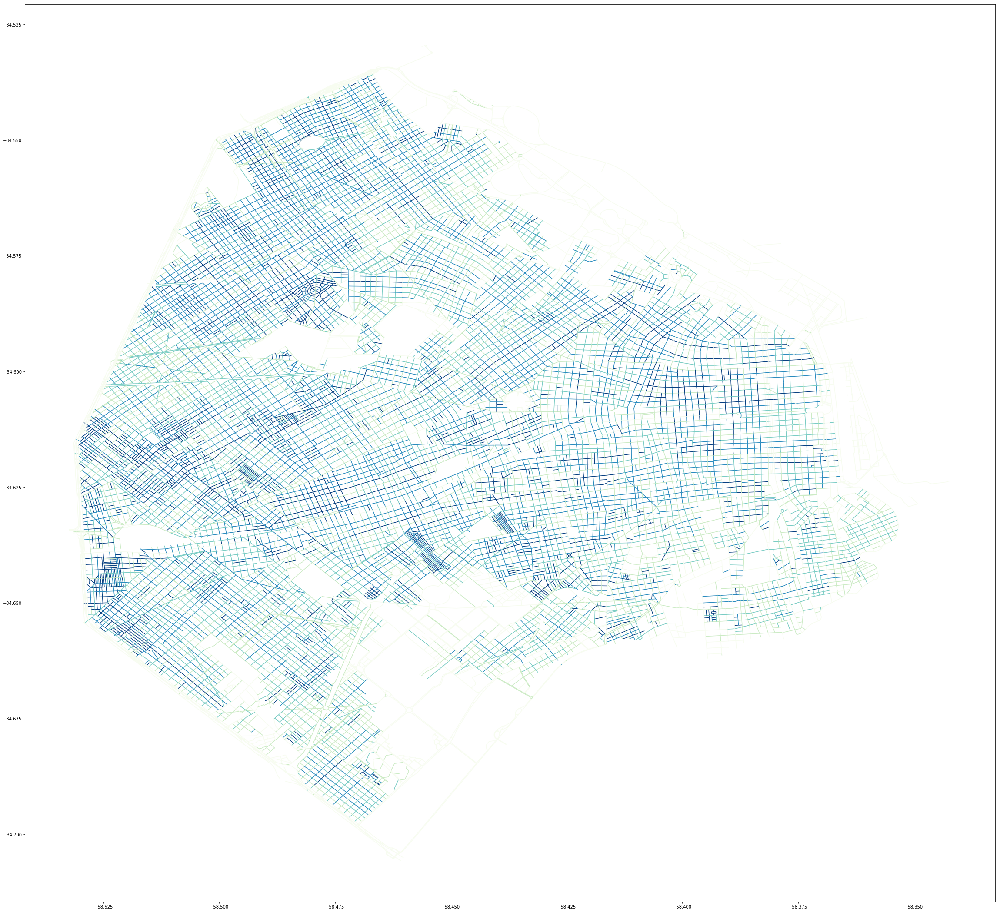

In [154]:
fig, ax = plt.subplots(1,1,figsize=(40,40))
geomain.plot(column='comerce_ratio', cmap='GnBu', scheme='quantiles', ax=ax)

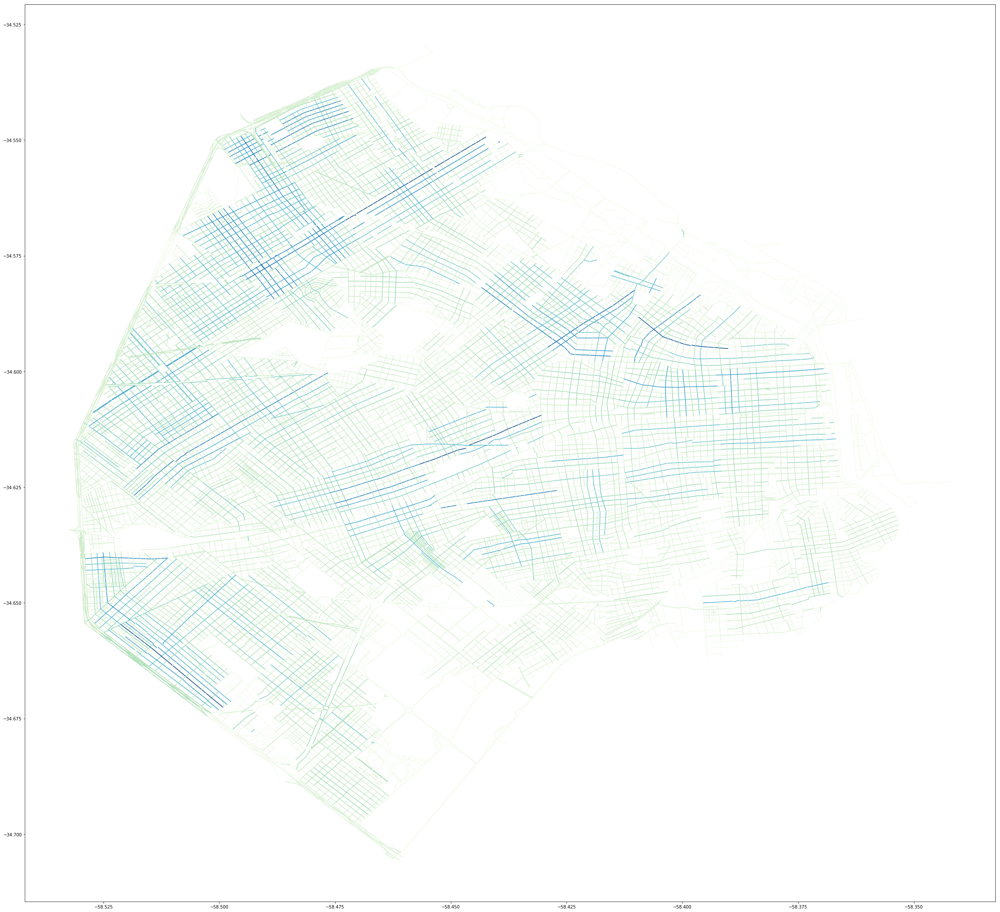

In [137]:
fig, ax = plt.subplots(1,1,figsize=(40,40))
geomain.plot(column='comerce_ratio', cmap='GnBu', ax=ax)